<a href="https://colab.research.google.com/github/erselazain/clustering-algorithms/blob/main/Main_Image_Captionku_ResNeXt50_Transfomer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install git+https://github.com/qubvel/classification_models.git

  Cloning https://github.com/qubvel/classification_models.git to /tmp/pip-req-build-q3di1cfh
  Running command git clone --filter=blob:none --quiet https://github.com/qubvel/classification_models.git /tmp/pip-req-build-q3di1cfh
  Resolved https://github.com/qubvel/classification_models.git to commit a0f006e05485a34ccf871c421279864b0ccd220b
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.5 MB/s eta 0:00:00
  Created wheel for image-classifiers: filename=image_classifiers-1.0.0-py3-none-any.whl size=20028 sha256=0f6cb76ef539ff1b9546039f77597b975348398d7ca7d23968bf2e3db1fe0557
  Stored in directory: /tmp/pip-ephem-wheel-cache-ook9z3nj/wheels/f5/13/cb/b1dbd79043c5a389742e422859b0b663adcd7b5c220928c339
Successfully built image-classifiers


# Import libraries

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
import tensorflow as tf
import string
import numpy as np
import pandas as pd
from numpy import array
from PIL import Image
from IPython.display import Image
import matplotlib.pyplot as plt
import keras
import sys, time, os, warnings
warnings.filterwarnings("ignore")
import tensorflow as tf
from tqdm import tqdm
from nltk.translate.bleu_score import sentence_bleu
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from tensorflow.keras.applications import resnet50
from keras.layers import Embedding
from keras.layers import Dropout
from keras.callbacks import ModelCheckpoint
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.text import Tokenizer
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

Mounted at /content/gdrive


# Preparing

In [ ]:
image_path = "/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)"
dir_Flickr_text = "/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Caption_all_baru/mycaption (percobaan).txt"
# Read the file text
file = open(dir_Flickr_text, 'r')
text = file.read()
file.close()

# Split the data to column
lines = text.split('\n')
data = [line.split(',', 2) for line in lines if line]
data = pd.DataFrame(data, columns=['index', 'filename', 'caption'])

uni_filenames = np.unique(data.filename.values)
data.head()

,index,filename,caption
0,0,cabaibesar0001.jpg,"A big red chili in full bloom , surrounded by ..."
1,1,cabaibesar0001.jpg,The big chili pepper is surrounded by other pl...
2,2,cabaibesar0001.jpg,"A big red chili growing on its stem , protecte..."
3,3,cabaibesar0001.jpg,A big chili is coloured red in the garden .
4,4,cabaibesar0001.jpg,"A big chili ready to be picked , its plump fle..."


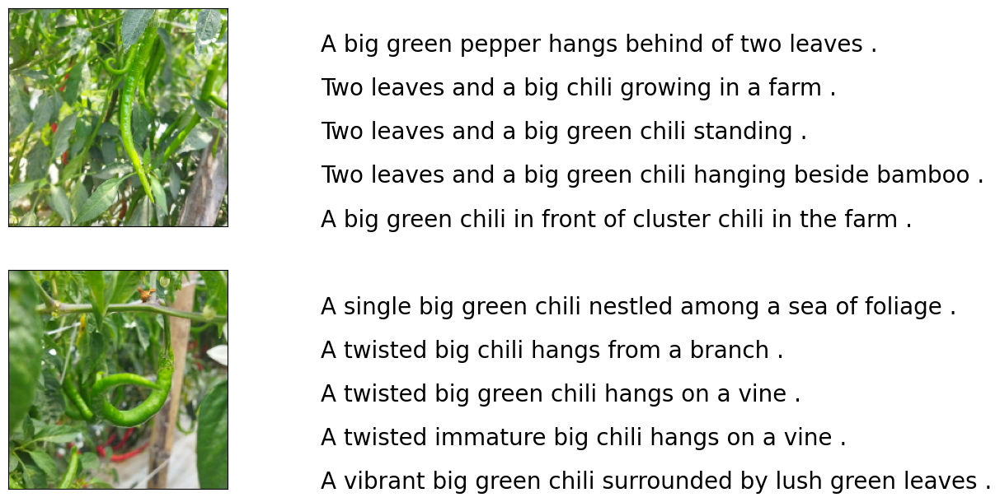

In [ ]:
# Showing some examples image and captions
npic = 5
npix = 224
target_size = (npix,npix,3)
count = 1
fig = plt.figure(figsize=(10,20))
for jpgfnm in uni_filenames[24:26]:
    filename = image_path + '/' + jpgfnm
    captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
    image_load = load_img(filename, target_size=target_size)

    ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
    ax.imshow(image_load)
    count += 1

    ax = fig.add_subplot(npic,2,count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions))
    for i, caption in enumerate(captions):
        ax.text(0,i,caption,fontsize=20)
    count += 1
plt.show()

In [ ]:
# calculate vocabulary
vocabulary = []
for txt in data.caption.values:
    vocabulary.extend(txt.split())
print('Vocabulary Size: %d' % len(set(vocabulary)))
# create list with the length img & caption same
img = data["filename"].tolist()
caption = data["caption"].tolist()
print(f"len(img) : {len(img)}")
print(f"len(caption) : {len(caption)}")

type_of_punctuation = "!\"#$%&'()*+,./:;<=>?@[\]^_`{|}~"
# To remove punctuations
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(type_of_punctuation)
    return(text_no_punctuation)
# Text cleaning
def text_clean(text_original):
    text = remove_punctuation(text_original)
    text = text.lower()
    return(text)
for i, caption in enumerate(data.caption.values):
    newcaption = text_clean(caption)
    data["caption"].iloc[i] = newcaption
# Text already cleaning
clean_vocabulary = []
for txt in data.caption.values:
    clean_vocabulary.extend(txt.split())
print('Clean Vocabulary Size: %d' % len(set(clean_vocabulary)))

Vocabulary Size: 831
len(img) : 12000
len(caption) : 12000
Clean Vocabulary Size: 726


In [ ]:
# Adding special token
PATH = "/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/"
all_captions = []
for caption  in data["caption"].astype(str):
    caption = '<start> ' + caption+ ' <end>'
    all_captions.append(caption)
all_captions[:10]

['<start> a big red chili in full bloom , surrounded by lush green leaves . <end>',
 '<start> the big chili pepper is surrounded by other plants and flowers . <end>',
 '<start> a big red chili growing on its stem , protected by the leaves of the plant . <end>',
 '<start> a big chili is coloured red in the garden . <end>',
 '<start> a big chili ready to be picked , its plump flesh a deep red . <end>',
 '<start> a close-up of a big red chili pepper growing on a tree . <end>',
 '<start> a single big red chili hangs from a branch . <end>',
 '<start> a big chili is hanging between leaves . <end>',
 '<start> the big chili is a beautiful and vibrant plant . <end>',
 '<start> a healthy big chili has no disease . <end>']

In [ ]:
# Creating image name address vector
all_img_name_vector = []
for annot in data["filename"]:
    full_image_path = PATH + annot
    all_img_name_vector.append(full_image_path)
all_img_name_vector[:10]

['/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0001.jpg',
 '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0001.jpg',
 '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0001.jpg',
 '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0001.jpg',
 '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0001.jpg',
 '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0002.jpg',
 '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0002.jpg',
 '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0002.jpg',
 '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0002.jpg',
 '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar al

In [ ]:
# Shuffling image and caption
def data_limiter(num,total_captions,all_img_name_vector):
  train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
  train_captions = train_captions[:num]
  img_name_vector = img_name_vector[:num]
  return train_captions,img_name_vector
train_captions,img_name_vector = data_limiter(12000,all_captions,all_img_name_vector)
print(f"len(all_img_name_vector) : {len(img_name_vector)}")
print(f"len(all_captions) : {len(train_captions)}")

len(all_img_name_vector) : 12000
len(all_captions) : 12000


#Preprocessing

## Preprocessing Image (Feature Extraction)

In [ ]:
from classification_models.tfkeras import Classifiers
Classifiers.models_names()
ResNeXt50, preprocess_input = Classifiers.get('resnext50')
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    return img, image_path

In [ ]:
image_model = ResNeXt50(input_shape=(224,224, 3),include_top=False,weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

94428600/94428600 [==============================] - 1s 0us/step


In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(image_features_extract_model, to_file="/content/gdrive/MyDrive/Tesis/ResNext50 model/my_modelresnext.png", show_shapes=True)

In [ ]:
image_features_extract_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 224, 224, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['bn_data[0][0]']             
 g2D)                                                                                             
                                                                                            

In [ ]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

100%|██████████| 150/150 [02:46<00:00,  1.11s/it]


## Preprocess and tokenize the captions

In [ ]:
top_k = 1000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)
vocab_list = list(tokenizer.word_index.keys())
print(vocab_list)
print(train_seqs)

['<unk>', '<start>', '<end>', 'chili', 'a', 'the', 'by', 'leaf', 'green', 'in', 'curly', 'leaves', 'big', 'above', 'hanging', 'field', 'healthy', 'discovered', 'fruit', 'fly', 'ground', 'two', 'red', 'eye', "'s", 'bird', 'thai', 'unhealthy', 'damaged', 'brown', 'from', 'branch', 'on', 'silver', 'of', 'plastic', 'hangs', 'yellow', 'surface', 'curved', 'infested', 'no', 'surrounded', 'dark', 'damage', 'found', 'fusarium', 'wilt', 'spot', 'affected', 'disease', 'and', 'aphids', 'attacked', 'showing', 'with', 'displaying', 'growing', 'virus', 'lush', 'farm', 'gracefully', 'grows', 'signs', 'chilies', 'or', 'orange', 'beside', 'looks', 'vibrant', 'an', 'gemini', 'immature', 'curling', 'suspended', 'thrips', 'area', 'infected', 'unripe', 'sizable', 'rotten', 'elegantly', 'shows', 'amidst', 'displays', 'darkened', 'uncovered', 'light', 'foliage', 'thriving', 'between', 'naturally', 'twisted', 'wide', 'spotted', 'surrounding', 'hang', 'visible', 'blackened', 'three', 'flourishing', 'altered', 

In [ ]:
# Adding <pad> token
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
# # Tambahkan token <pad> ke teks pelatihan
# train_captions_with_pad = [caption + ' <pad>' for caption in train_captions]

# # Lakukan pelatihan ulang tokenizer
# tokenizer.fit_on_texts(train_captions_with_pad)

# # Lakukan padding menggunakan token <pad>
# train_seqs_with_pad = tokenizer.texts_to_sequences(train_captions_with_pad)
# padded_train_seqs_with_pad = pad_sequences(train_seqs_with_pad, padding='post')  # 'post' untuk padding di bagian akhir

# print(padded_train_seqs_with_pad)


In [ ]:
# Printing all vocabulary
myvocabulary = tokenizer.word_index
print("Vocabulary:")
for word, index in myvocabulary.items():
    print(f"{word}: {index}")

Vocabulary:
<unk>: 1
<start>: 2
<end>: 3
chili: 4
a: 5
the: 6
by: 7
leaf: 8
green: 9
in: 10
curly: 11
leaves: 12
big: 13
above: 14
hanging: 15
field: 16
healthy: 17
discovered: 18
fruit: 19
fly: 20
ground: 21
two: 22
red: 23
eye: 24
's: 25
bird: 26
thai: 27
unhealthy: 28
damaged: 29
brown: 30
from: 31
branch: 32
on: 33
silver: 34
of: 35
plastic: 36
hangs: 37
yellow: 38
surface: 39
curved: 40
infested: 41
no: 42
surrounded: 43
dark: 44
damage: 45
found: 46
fusarium: 47
wilt: 48
spot: 49
affected: 50
disease: 51
and: 52
aphids: 53
attacked: 54
showing: 55
with: 56
displaying: 57
growing: 58
virus: 59
lush: 60
farm: 61
gracefully: 62
grows: 63
signs: 64
chilies: 65
or: 66
orange: 67
beside: 68
looks: 69
vibrant: 70
an: 71
gemini: 72
immature: 73
curling: 74
suspended: 75
thrips: 76
area: 77
infected: 78
unripe: 79
sizable: 80
rotten: 81
elegantly: 82
shows: 83
amidst: 84
displays: 85
darkened: 86
uncovered: 87
light: 88
foliage: 89
thriving: 90
between: 91
naturally: 92
twisted: 93
wide: 

In [ ]:
# Making all text vector to the same length
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')
cap_vector.shape

(12000, 27)

# Split the data into training and testing

In [ ]:
# Splitting Train, Val, and Test
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.2,
                                                                    random_state=0)
img_name_test, img_name_val, cap_test, cap_val = train_test_split(img_name_val,
                                                                    cap_val,
                                                                    test_size=0.5,
                                                                    random_state=42)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val), len(img_name_test), len(cap_test)

(9600, 9600, 1200, 1200, 1200, 1200)

In [ ]:
print(img_name_train)

['/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dauncabaikeriting0009.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dcabairawitvg0096.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dauncabaibesar0124.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabairawit0147.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesar0188.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabairawitlb0066.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dauncabairawits0114.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesarlb0118.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesarlb0034.jpg', '/content/gdrive/MyDrive/Tesis/Dataset

In [ ]:
print(img_name_val)

['/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabairawitlb0111.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaikeritinglf0081.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dauncabairawitbercak0091.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dcabaibesarvg0051.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dauncabairawitbercak0050.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dcabaikeritingkk0122.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dauncabairawitbercak0016.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabairawit0073.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dauncabaikeriting0079.jpg', '/content/

In [ ]:
print(img_name_test)

['/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dcabairawitvg0005.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabairawit0088.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaikeritinglf0079.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dcabairawitvg0069.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaibesarlb0179.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dcabaibesarb0047.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dauncabaibesar0142.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/cabaikeriting0191.jpg', '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/Gambar all baru (percobaan resnext50)/dauncabaibesar0198.jpg', '/content/gdrive/MyDrive/Tesis/Datase

# Create dataset for training

In [ ]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000 # configure as wanted, but must be consistent

In [ ]:
# Load features
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [ ]:
# Load features for training
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))
# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)
# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Load features for validation
dataset_val = tf.data.Dataset.from_tensor_slices((img_name_val, cap_val))
dataset_val = dataset_val.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)
dataset_val = dataset_val.batch(BATCH_SIZE)

In [ ]:
# cobaan = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))
# for alphaku in cobaan:
#   print(alphaku)

In [ ]:
# cobaan1 = cobaan.map(lambda item1, item2: tf.numpy_function(
#           map_func, [item1, item2], [tf.float32, tf.int32]),
#           num_parallel_calls=tf.data.experimental.AUTOTUNE)
# for alphaku in cobaan1:
#   print(alphaku)

# Creating Transformer Model

In [ ]:
def get_angles(pos, i, d_model):
  angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
  return pos * angle_rates

In [ ]:
def positional_encoding_1d(position, d_model):
  angle_rads = get_angles(np.arange(position)[:, np.newaxis],
                          np.arange(d_model)[np.newaxis, :],
                          d_model)

  # apply sin to even indices in the array; 2i
  angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])

  # apply cos to odd indices in the array; 2i+1
  angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])

  pos_encoding = angle_rads[np.newaxis, ...]

  return tf.cast(pos_encoding, dtype=tf.float32)

In [ ]:
def positional_encoding_2d(row,col,d_model):
  assert d_model % 2 == 0
  # first d_model/2 encode row embedding and second d_model/2 encode column embedding
  row_pos = np.repeat(np.arange(row),col)[:,np.newaxis]
  col_pos = np.repeat(np.expand_dims(np.arange(col),0),row,axis=0).reshape(-1,1)
  angle_rads_row = get_angles(row_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
  angle_rads_col = get_angles(col_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
  #apply sin and cos to odd and even indices resp.
  angle_rads_row[:, 0::2] = np.sin(angle_rads_row[:, 0::2])
  angle_rads_row[:, 1::2] = np.cos(angle_rads_row[:, 1::2])
  angle_rads_col[:, 0::2] = np.sin(angle_rads_col[:, 0::2])
  angle_rads_col[:, 1::2] = np.cos(angle_rads_col[:, 1::2])
  pos_encoding = np.concatenate([angle_rads_row,angle_rads_col],axis=1)[np.newaxis, ...]

  return tf.cast(pos_encoding, dtype=tf.float32)

In [ ]:
def create_padding_mask(seq):
  seq = tf.cast(tf.math.equal(seq, 0), tf.float32)

  # add extra dimensions to add the padding
  # to the attention logits.
  return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

In [ ]:
def create_look_ahead_mask(size):
  mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
  return mask  # (seq_len, seq_len)

In [ ]:
def scaled_dot_product_attention(q, k, v, mask):
  """Calculate the attention weights.
  q, k, v must have matching leading dimensions.
  k, v must have matching penultimate dimension, i.e.: seq_len_k = seq_len_v.
  The mask has different shapes depending on its type(padding or look ahead)
  but it must be broadcastable for addition.

  Args:
    q: query shape == (..., seq_len_q, depth)
    k: key shape == (..., seq_len_k, depth)
    v: value shape == (..., seq_len_v, depth_v)
    mask: Float tensor with shape broadcastable
          to (..., seq_len_q, seq_len_k). Defaults to None.

  Returns:
    output, attention_weights
  """

  matmul_qk = tf.matmul(q, k, transpose_b=True)  # (..., seq_len_q, seq_len_k)

  # scale matmul_qk
  dk = tf.cast(tf.shape(k)[-1], tf.float32)
  scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

  # add the mask to the scaled tensor.
  if mask is not None:
    scaled_attention_logits += (mask * -1e9)  #adding -Inf where mask is 1 s.t. value get ignored in softmax

  # softmax is normalized on the last axis (seq_len_k) so that the scores
  # add up to 1.
  attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # (..., seq_len_q, seq_len_k)

  output = tf.matmul(attention_weights, v)  # (..., seq_len_q, depth_v)

  return output, attention_weights

In [ ]:
class MultiHeadAttention(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads):
    super(MultiHeadAttention, self).__init__()
    self.num_heads = num_heads
    self.d_model = d_model

    assert d_model % self.num_heads == 0

    self.depth = d_model // self.num_heads

    self.wq = tf.keras.layers.Dense(d_model)
    self.wk = tf.keras.layers.Dense(d_model)
    self.wv = tf.keras.layers.Dense(d_model)

    self.dense = tf.keras.layers.Dense(d_model)

  def split_heads(self, x, batch_size):
    """Split the last dimension into (num_heads, depth).
    Transpose the result such that the shape is (batch_size, num_heads, seq_len, depth)
    """
    x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
    return tf.transpose(x, perm=[0, 2, 1, 3])

  def call(self, v, k, q, mask=None):
    batch_size = tf.shape(q)[0]

    q = self.wq(q)  # (batch_size, seq_len, d_model)
    k = self.wk(k)  # (batch_size, seq_len, d_model)
    v = self.wv(v)  # (batch_size, seq_len, d_model)

    q = self.split_heads(q, batch_size)  # (batch_size, num_heads, seq_len_q, depth)
    k = self.split_heads(k, batch_size)  # (batch_size, num_heads, seq_len_k, depth)
    v = self.split_heads(v, batch_size)  # (batch_size, num_heads, seq_len_v, depth)

    # scaled_attention.shape == (batch_size, num_heads, seq_len_q, depth)
    # attention_weights.shape == (batch_size, num_heads, seq_len_q, seq_len_k)
    scaled_attention, attention_weights = scaled_dot_product_attention(
        q, k, v, mask)

    scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len_q, num_heads, depth)

    concat_attention = tf.reshape(scaled_attention,
                                  (batch_size, -1, self.d_model))  # (batch_size, seq_len_q, d_model)

    output = self.dense(concat_attention)  # (batch_size, seq_len_q, d_model)

    return output, attention_weights

In [ ]:
def point_wise_feed_forward_network(d_model, dff):
  return tf.keras.Sequential([
      tf.keras.layers.Dense(dff, activation='relu'),  # (batch_size, seq_len, dff)
      tf.keras.layers.Dense(d_model)  # (batch_size, seq_len, d_model)
  ])

In [ ]:
class EncoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(EncoderLayer, self).__init__()

    self.mha = MultiHeadAttention(d_model, num_heads)
    self.ffn = point_wise_feed_forward_network(d_model, dff)

    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)

  def call(self, x, training, mask=None):

    attn_output, _ = self.mha(x, x, x, mask)  # (batch_size, input_seq_len, d_model)
    attn_output = self.dropout1(attn_output, training=training)
    out1 = self.layernorm1(x + attn_output)  # (batch_size, input_seq_len, d_model)

    ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, d_model)
    ffn_output = self.dropout2(ffn_output, training=training)
    out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, d_model)

    return out2

In [ ]:
class DecoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(DecoderLayer, self).__init__()

    self.mha1 = MultiHeadAttention(d_model, num_heads)
    self.mha2 = MultiHeadAttention(d_model, num_heads)

    self.ffn = point_wise_feed_forward_network(d_model, dff)

    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    self.dropout3 = tf.keras.layers.Dropout(rate)


  def call(self, x, enc_output, training,
           look_ahead_mask=None, padding_mask=None):
    # enc_output.shape == (batch_size, input_seq_len, d_model)

    # using look ahead mask so that during self attention current query dont consider future token
    attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)  # (batch_size, target_seq_len, d_model)
    attn1 = self.dropout1(attn1, training=training)
    out1 = self.layernorm1(attn1 + x)

    # use padding mask to avoid padded values of both enc_output and dec_input
    attn2, attn_weights_block2 = self.mha2(
        enc_output, enc_output, out1, padding_mask)  # (batch_size, target_seq_len, d_model)
    attn2 = self.dropout2(attn2, training=training)
    out2 = self.layernorm2(attn2 + out1)  # (batch_size, target_seq_len, d_model)

    ffn_output = self.ffn(out2)  # (batch_size, target_seq_len, d_model)
    ffn_output = self.dropout3(ffn_output, training=training)
    out3 = self.layernorm3(ffn_output + out2)  # (batch_size, target_seq_len, d_model)

    return out3, attn_weights_block1, attn_weights_block2

In [ ]:
class Encoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff,
               row_size,col_size,rate=0.1):
    super(Encoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers

    self.embedding = tf.keras.layers.Dense(self.d_model,activation='relu')
    self.pos_encoding = positional_encoding_2d(row_size,col_size,
                                            self.d_model)


    self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate)
                       for _ in range(num_layers)]

    self.dropout = tf.keras.layers.Dropout(rate)

  def call(self, x, training, mask=None):
    # shape(x) = (batch_size,seq_len(H*W),features)
    seq_len = tf.shape(x)[1]

    # adding embedding and position encoding.
    x = self.embedding(x)  # (batch_size, input_seq_len(H*W), d_model)
    x += self.pos_encoding[:, :seq_len, :]

    x = self.dropout(x, training=training)

    for i in range(self.num_layers):
      x = self.enc_layers[i](x, training, mask)

    return x  # (batch_size, input_seq_len, d_model)

In [ ]:
class Decoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size,
               maximum_position_encoding, rate=0.1):
    super(Decoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers

    self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
    self.pos_encoding = positional_encoding_1d(maximum_position_encoding, d_model)

    self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate)
                       for _ in range(num_layers)]
    self.dropout = tf.keras.layers.Dropout(rate)

  def call(self, x, enc_output, training,
           look_ahead_mask=None, padding_mask=None):

    seq_len = tf.shape(x)[1]
    attention_weights = {}

    x = self.embedding(x)  # (batch_size, target_seq_len, d_model)
    x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
    x += self.pos_encoding[:, :seq_len, :]

    x = self.dropout(x, training=training)

    for i in range(self.num_layers):
      x, block1, block2 = self.dec_layers[i](x, enc_output, training,
                                             look_ahead_mask, padding_mask)

      attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
      attention_weights['decoder_layer{}_block2'.format(i+1)] = block2

    # x.shape == (batch_size, target_seq_len, d_model)
    return x, attention_weights

In [ ]:
class Transformer(tf.keras.Model):
  def __init__(self, num_layers, d_model, num_heads, dff,row_size,col_size,
               target_vocab_size,max_pos_encoding, rate=0.1):
    super(Transformer, self).__init__()

    self.encoder = Encoder(num_layers, d_model, num_heads, dff,row_size,col_size, rate)

    self.decoder = Decoder(num_layers, d_model, num_heads, dff,
                           target_vocab_size,max_pos_encoding, rate)

    self.final_layer = tf.keras.layers.Dense(target_vocab_size)

  def call(self, inp, tar, training,look_ahead_mask=None, dec_padding_mask=None,enc_padding_mask=None):

    enc_output = self.encoder(inp, training, enc_padding_mask)  # (batch_size, inp_seq_len, d_model)

    # dec_output.shape == (batch_size, tar_seq_len, d_model)
    dec_output, attention_weights = self.decoder(
        tar, enc_output, training, look_ahead_mask, dec_padding_mask)

    final_output = self.final_layer(dec_output)  # (batch_size, tar_seq_len, target_vocab_size)

    return final_output, attention_weights

In [ ]:
num_layer = 4
d_model = 512
dff = 512
num_heads = 4
row_size = 7
col_size = 7
target_vocab_size = top_k + 1
dropout_rate = 0.1

In [ ]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
  def __init__(self, d_model, warmup_steps=4000):
    super(CustomSchedule, self).__init__()

    self.d_model = d_model
    self.d_model = tf.cast(self.d_model, tf.float32)

    self.warmup_steps = warmup_steps

  def __call__(self, step):
    step = tf.cast(step, tf.float32)
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps ** -1.5)

    return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

In [ ]:
learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98,
                                     epsilon=1e-9)

In [ ]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

In [ ]:
def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_sum(loss_)/tf.reduce_sum(mask)

In [ ]:
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(
    name='train_accuracy')

In [ ]:
# Initialize metrics for validation
val_loss = tf.keras.metrics.Mean(name='val_loss')
val_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(
    name='val_accuracy')

In [ ]:
transformer = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)

In [ ]:
def create_masks_decoder(tar):
  look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
  dec_target_padding_mask = create_padding_mask(tar)
  combined_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)
  return combined_mask

In [ ]:
@tf.function
def train_step(img_tensor, tar):
  tar_inp = tar[:, :-1]
  tar_real = tar[:, 1:]

  dec_mask = create_masks_decoder(tar_inp)

  with tf.GradientTape() as tape:
    predictions, _ = transformer(img_tensor, tar_inp,
                                 True,
                                 dec_mask)
    loss = loss_function(tar_real, predictions)

  gradients = tape.gradient(loss, transformer.trainable_variables)
  optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))

  train_loss(loss)
  train_accuracy(tar_real, predictions)
  # print("Tar")
  # print(type(tar))
  # if tf.executing_eagerly():
  #   tar_value = tar.numpy()  # This should work in eager execution
  #   print(tar_value)
  # else:
  #   print("Eager execution is not enabled. Consider enabling it.")
  # print("Tensor Image")
  # print(type(img_tensor))
  # print("Tar real")
  # print(type(tar_real))
  # print("Prediksi")
  # print(type(predictions))

In [ ]:
# Function for validation step
@tf.function
def val_step(img_tensor, tar):
  tar_inp = tar[:, :-1]
  tar_real = tar[:, 1:]

  dec_mask = create_masks_decoder(tar_inp)

  predictions, _ = transformer(img_tensor, tar_inp,
                               False,  # Set training to False for validation
                               dec_mask)
  loss = loss_function(tar_real, predictions)

  val_loss(loss)
  val_accuracy(tar_real, predictions)

In [ ]:
# print(list(enumerate(dataset)))

This cell output is too large and can only be displayed while logged in.


In [ ]:
# Training loop
for epoch in range(100):
  start = time.time()

  train_loss.reset_states()
  train_accuracy.reset_states()
  val_loss.reset_states()
  val_accuracy.reset_states()

  # Training steps
  for (batch, (img_tensor, tar)) in enumerate(dataset):
    train_step(img_tensor, tar)

  # Validation steps
  for (batch, (img_tensor_val, tar_val)) in enumerate(dataset_val):
    val_step(img_tensor_val, tar_val)

  # Print training and validation metrics
  print ('Epoch {} Loss {:.4f} Accuracy {:.4f} Val Loss {:.4f} Val Accuracy {:.4f}'.format(
      epoch + 1,
      train_loss.result(),
      train_accuracy.result(),
      val_loss.result(),
      val_accuracy.result()))

  print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

Epoch 1 Loss 4.5102 Accuracy 0.0961 Val Loss 2.5421 Val Accuracy 0.2354
Time taken for 1 epoch: 199.87278580665588 secs

Epoch 2 Loss 2.0133 Accuracy 0.2761 Val Loss 1.5030 Val Accuracy 0.3156
Time taken for 1 epoch: 30.40087127685547 secs

Epoch 3 Loss 1.4355 Accuracy 0.3160 Val Loss 1.2461 Val Accuracy 0.3345
Time taken for 1 epoch: 31.036227703094482 secs

Epoch 4 Loss 1.2457 Accuracy 0.3309 Val Loss 1.1509 Val Accuracy 0.3421
Time taken for 1 epoch: 30.288718223571777 secs

Epoch 5 Loss 1.1500 Accuracy 0.3396 Val Loss 1.1139 Val Accuracy 0.3468
Time taken for 1 epoch: 30.46042251586914 secs

Epoch 6 Loss 1.1002 Accuracy 0.3441 Val Loss 1.0905 Val Accuracy 0.3503
Time taken for 1 epoch: 30.586214542388916 secs

Epoch 7 Loss 1.0703 Accuracy 0.3462 Val Loss 1.0706 Val Accuracy 0.3501
Time taken for 1 epoch: 30.321972608566284 secs

Epoch 8 Loss 1.0566 Accuracy 0.3482 Val Loss 1.1004 Val Accuracy 0.3460
Time taken for 1 epoch: 30.41633415222168 secs

Epoch 9 Loss 1.0548 Accuracy 0.3482

In [ ]:
transformer.save_weights('/content/gdrive/MyDrive/Tesis/ResNext50 model/6 layer/100 epoch/ResNeXt50-transformer(100)',save_format='tf')

In [ ]:
print(type(transformer))

<class '__main__.Transformer'>


# Load weight model
Load the weight model image captioning by triggering training 1 epoch

In [ ]:
# create variabel for loaded weight model
transformerr = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)
@tf.function
def train_step(img_tensor, tar):
  tar_inp = tar[:, :-1]
  tar_real = tar[:, 1:]

  dec_mask = create_masks_decoder(tar_inp)

  with tf.GradientTape() as tape:
    predictions, _ = transformerr(img_tensor, tar_inp,
                                 True,
                                 dec_mask)
    loss = loss_function(tar_real, predictions)

  gradients = tape.gradient(loss, transformerr.trainable_variables)
  optimizer.apply_gradients(zip(gradients, transformerr.trainable_variables))

  train_loss(loss)
  train_accuracy(tar_real, predictions)

In [ ]:
# Function for validation step
@tf.function
def val_step(img_tensor, tar):
  tar_inp = tar[:, :-1]
  tar_real = tar[:, 1:]

  dec_mask = create_masks_decoder(tar_inp)

  predictions, _ = transformerr(img_tensor, tar_inp,
                               False,  # Set training to False for validation
                               dec_mask)
  loss = loss_function(tar_real, predictions)

  val_loss(loss)
  val_accuracy(tar_real, predictions)

In [ ]:
# training 1 epoch (do not care how bad the result is)
for epoch in range(1):
  start = time.time()
  train_loss.reset_states()
  train_accuracy.reset_states()
  val_loss.reset_states()
  val_accuracy.reset_states()
  # Training steps
  for (batch, (img_tensor, tar)) in enumerate(dataset):
    train_step(img_tensor, tar)
  # Validation steps
  for (batch, (img_tensor_val, tar_val)) in enumerate(dataset_val):
    val_step(img_tensor_val, tar_val)
  # Print training and validation metrics
  print ('Epoch {} Loss {:.4f} Accuracy {:.4f} Val Loss {:.4f} Val Accuracy {:.4f}'.format(
      epoch + 1,
      train_loss.result(),
      train_accuracy.result(),
      val_loss.result(),
      val_accuracy.result()))
  print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

Epoch 1 Loss 4.3261 Accuracy 0.1233 Val Loss 2.2174 Val Accuracy 0.2750
Time taken for 1 epoch: 1110.6890649795532 secs



In [ ]:
# load the weight model
transformerr.load_weights('/content/gdrive/MyDrive/Tesis/ResNext50 model/4 layer/100 epoch/ResNeXt50-transformer(100)')

In [ ]:
type(transformerr)

__main__.Transformer

# Evaluate Caption

In [ ]:
def evaluate(image):

  temp_input = tf.expand_dims(load_image(image)[0], 0)
  img_tensor_val = image_features_extract_model(temp_input)
  img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

  start_token = tokenizer.word_index['<start>']
  end_token = tokenizer.word_index['<end>']

  #decoder input is start token.
  decoder_input = [start_token]
  output = tf.expand_dims(decoder_input, 0) #tokens
  result = [] #word list

  for i in range(27):
      dec_mask = create_masks_decoder(output)

      # predictions.shape == (batch_size, seq_len, vocab_size)
      predictions, attention_weights = transformerr(img_tensor_val,output,False,dec_mask)

      # select the last word from the seq_len dimension
      predictions = predictions[: ,-1:, :]  # (batch_size, 1, vocab_size)

      predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)
      # return the result if the predicted_id is equal to the end token
      if predicted_id == end_token:
          return result,tf.squeeze(output, axis=0), attention_weights
      # concatentate the predicted_id to the output which is given to the decoder
      # as its input.
      result.append(tokenizer.index_word[int(predicted_id)])
      output = tf.concat([output, predicted_id], axis=-1)

  return result,tf.squeeze(output, axis=0), attention_weights

## Creating BLEU Score

In [ ]:
##Transformers BLEU score mean on val data
score1_tranformer=[]
score2_tranformer=[]
score3_tranformer=[]
score4_tranformer=[]
caption_tranformer=[]
name_transformer=[]
real_transformer = []
for random in range(len(img_name_val)):
  image = img_name_val[random]
  name_transformer.append(image)
  real_cap = ' '.join([tokenizer.index_word[i] for i in cap_val[random] if i not in [0]])
  caption,result,attention_weights = evaluate(image)
  first = real_cap.split(' ', 1)[1]
  real_cap = first.rsplit(' ', 1)[0]
  for i in caption:
    if i=="":
        caption.remove(i)
  for i in real_cap:
    if i=="":
        real_cap.remove(i)
  rl_apn = []
  rl_apn.append(real_cap.split())
  reference = rl_apn
  candidate = caption
  score1 = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
  score2 = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
  score3 = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
  score4 = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
  score1_tranformer.append(score1)
  score2_tranformer.append(score2)
  score3_tranformer.append(score3)
  score4_tranformer.append(score4)
  result_join = ' '.join(caption)
  caption_tranformer.append(result_join)
  real_transformer.append(real_cap)
  print("Step-",random+1)
# Nama kolom untuk DataFrame
column_real = 'real caption'
column_caption = 'caption'
column_values1 = 'bleu-1'
column_values2 = 'bleu-2'
column_values3 = 'bleu-3'
column_values4 = 'bleu-4'
column_names = 'nama_file'
# Membuat DataFrame menggunakan Pandas
df_tranf = pd.DataFrame(data={column_names: name_transformer,
                              column_real: real_transformer,
                              column_caption: caption_tranformer,
                              column_values1: score1_tranformer,
                              column_values2: score2_tranformer,
                              column_values3: score3_tranformer,
                              column_values4: score4_tranformer})
# Menyimpan DataFrame ke dalam file Excel
df_tranf.to_excel("/content/gdrive/MyDrive/Tesis/Dataset_Cabai/All in One/6_tranformer_resnext50_100epoch.xlsx")

Step- 1
Step- 2
Step- 3
Step- 4
Step- 5
Step- 6
Step- 7
Step- 8
Step- 9
Step- 10
Step- 11
Step- 12
Step- 13
Step- 14
Step- 15
Step- 16
Step- 17
Step- 18
Step- 19
Step- 20
Step- 21
Step- 22
Step- 23
Step- 24
Step- 25
Step- 26
Step- 27
Step- 28
Step- 29
Step- 30
Step- 31
Step- 32
Step- 33
Step- 34
Step- 35
Step- 36
Step- 37
Step- 38
Step- 39
Step- 40
Step- 41
Step- 42
Step- 43
Step- 44
Step- 45
Step- 46
Step- 47
Step- 48
Step- 49
Step- 50
Step- 51
Step- 52
Step- 53
Step- 54
Step- 55
Step- 56
Step- 57
Step- 58
Step- 59
Step- 60
Step- 61
Step- 62
Step- 63
Step- 64
Step- 65
Step- 66
Step- 67
Step- 68
Step- 69
Step- 70
Step- 71
Step- 72
Step- 73
Step- 74
Step- 75
Step- 76
Step- 77
Step- 78
Step- 79
Step- 80
Step- 81
Step- 82
Step- 83
Step- 84
Step- 85
Step- 86
Step- 87
Step- 88
Step- 89
Step- 90
Step- 91
Step- 92
Step- 93
Step- 94
Step- 95
Step- 96
Step- 97
Step- 98
Step- 99
Step- 100
Step- 101
Step- 102
Step- 103
Step- 104
Step- 105
Step- 106
Step- 107
Step- 108
Step- 109
Step- 110
Step- 11

In [ ]:
##Transformers BLEU score mean on test data
score1_tranformer=[]
score2_tranformer=[]
score3_tranformer=[]
score4_tranformer=[]
caption_tranformer=[]
name_transformer=[]
for random in range(len(img_name_test)):
  image = img_name_test[random]
  name_transformer.append(image)
  real_cap = ' '.join([tokenizer.index_word[i] for i in cap_test[random] if i not in [0]])
  caption,result,attention_weights = evaluate(image)
  first = real_cap.split(' ', 1)[1]
  real_cap = first.rsplit(' ', 1)[0]
  for i in caption:
    if i=="":
        caption.remove(i)
  for i in real_cap:
    if i=="":
        real_cap.remove(i)
  rl_apn = []
  rl_apn.append(real_cap.split())
  reference = rl_apn
  candidate = caption
  score1 = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
  score2 = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
  score3 = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
  score4 = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
  score1_tranformer.append(score1)
  score2_tranformer.append(score2)
  score3_tranformer.append(score3)
  score4_tranformer.append(score4)
  result_join = ' '.join(caption)
  caption_tranformer.append(result_join)
  print("Step-",random+1)
# Nama kolom untuk DataFrame
column_caption = 'caption'
column_values1 = 'normal_bleu-1'
column_values2 = 'normal_bleu-2'
column_values3 = 'normal_bleu-3'
column_values4 = 'normal_bleu-4'
column_names = 'nama_file'
# Membuat DataFrame menggunakan Pandas
df_tranf = pd.DataFrame(data={column_names: name_transformer,
                              column_caption: caption_tranformer,
                              column_values1: score1_tranformer,
                              column_values2: score2_tranformer,
                              column_values3: score3_tranformer,
                              column_values4: score4_tranformer})
# Menyimpan DataFrame ke dalam file Excel
df_tranf.to_excel("/content/gdrive/MyDrive/Tesis/Dataset_Cabai/tranformer_normal_scoreorcaption_resnext50.xlsx")

Step- 1
Step- 2
Step- 3
Step- 4
Step- 5
Step- 6
Step- 7
Step- 8
Step- 9
Step- 10
Step- 11
Step- 12
Step- 13
Step- 14
Step- 15
Step- 16
Step- 17
Step- 18
Step- 19
Step- 20
Step- 21
Step- 22
Step- 23
Step- 24
Step- 25
Step- 26
Step- 27
Step- 28
Step- 29
Step- 30
Step- 31
Step- 32
Step- 33
Step- 34
Step- 35
Step- 36
Step- 37
Step- 38
Step- 39
Step- 40
Step- 41
Step- 42
Step- 43
Step- 44
Step- 45
Step- 46
Step- 47
Step- 48
Step- 49
Step- 50
Step- 51
Step- 52
Step- 53
Step- 54
Step- 55
Step- 56
Step- 57
Step- 58
Step- 59
Step- 60
Step- 61
Step- 62
Step- 63
Step- 64
Step- 65
Step- 66
Step- 67
Step- 68
Step- 69
Step- 70
Step- 71
Step- 72
Step- 73
Step- 74
Step- 75
Step- 76
Step- 77
Step- 78
Step- 79
Step- 80
Step- 81
Step- 82
Step- 83
Step- 84
Step- 85
Step- 86
Step- 87
Step- 88
Step- 89
Step- 90
Step- 91
Step- 92
Step- 93
Step- 94
Step- 95
Step- 96
Step- 97
Step- 98
Step- 99
Step- 100
Step- 101
Step- 102
Step- 103
Step- 104
Step- 105
Step- 106
Step- 107
Step- 108
Step- 109
Step- 110
Step- 11

# Create Caption from a Random Validation Data

BLEU-1 score: 40.39231756892703
BLEU-2 score: 22.64441432512635
BLEU-3 score: 9.589141899878343e-101
BLEU-4 score: 5.655219558433938e-153
Predicted Caption: green curly chili leaf damaged by aphids showcases a darkened surface


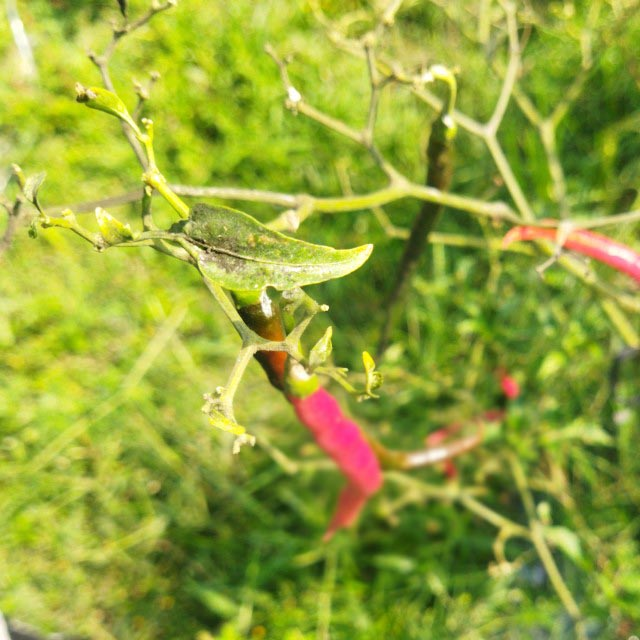

In [ ]:
# select random image from validation data
rid = 5
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.33,0.33,0.33,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Predicted Caption:', ' '.join(caption))
Image(filename = image)

BLEU-1 score: 34.99999999999999
BLEU-2 score: 23.50811729908136
BLEU-3 score: 14.817121895615262
BLEU-4 score: 2.874927559528803e-76
Predicted Caption: discovered a green bird 's eye chili leaf infected by leaf spot showing a dark brown spot in the field


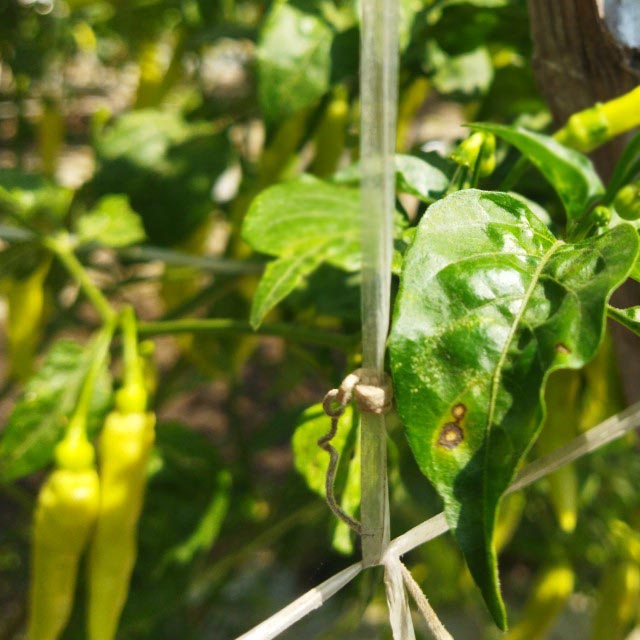

In [ ]:
# select random image from validation data
rid = 4
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.33,0.33,0.33,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Predicted Caption:', ' '.join(caption))
Image(filename = image)

BLEU-1 score: 50.0
BLEU-2 score: 43.85290096535146
BLEU-3 score: 36.73153683529942
BLEU-4 score: 30.576902884505113
Predicted Caption: two yellow bird 's eye chili infested by fruit fly hanging from a branch


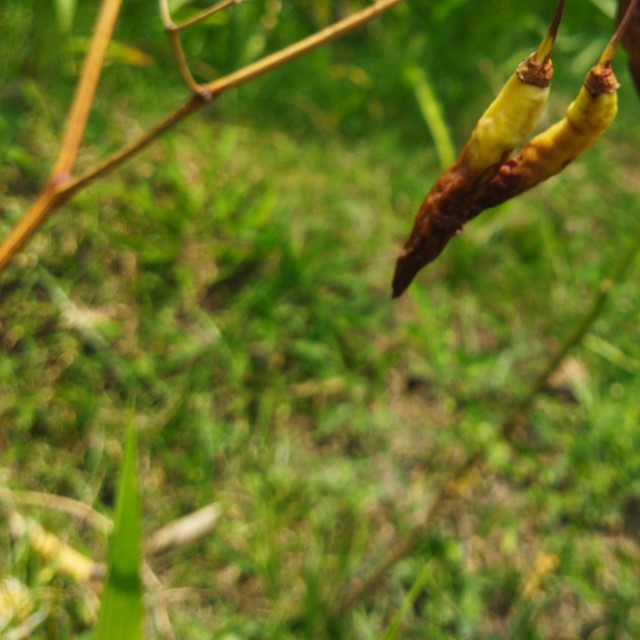

In [ ]:
# select random image from validation data
rid = 0
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.33,0.33,0.33,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Predicted Caption:', ' '.join(caption))
Image(filename = image)

BLEU-1 score: 14.248453076221212
BLEU-2 score: 4.5086465338368087e-153
BLEU-3 score: 3.4727012665988976e-202
BLEU-4 score: 8.020204191025903e-230
Predicted Caption: a green leaf looks healthy surrounded by neighboring leaves


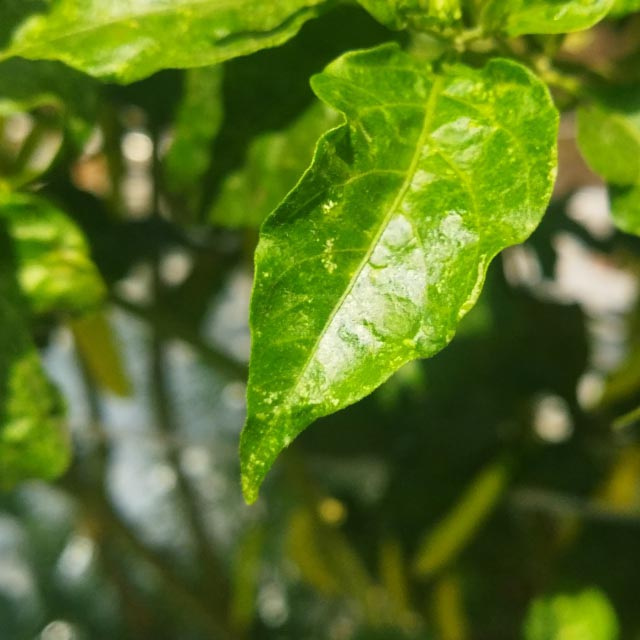

In [ ]:
# select random image from validation data
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.33,0.33,0.33,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Predicted Caption:', ' '.join(caption))
Image(filename = image)

BLEU-1 score: 41.66666666666667
BLEU-2 score: 38.92494720807615
BLEU-3 score: 36.05790708802296
BLEU-4 score: 31.702331385234306
Predicted Caption: a curved red curly chili hangs gracefully with an immature curly chili


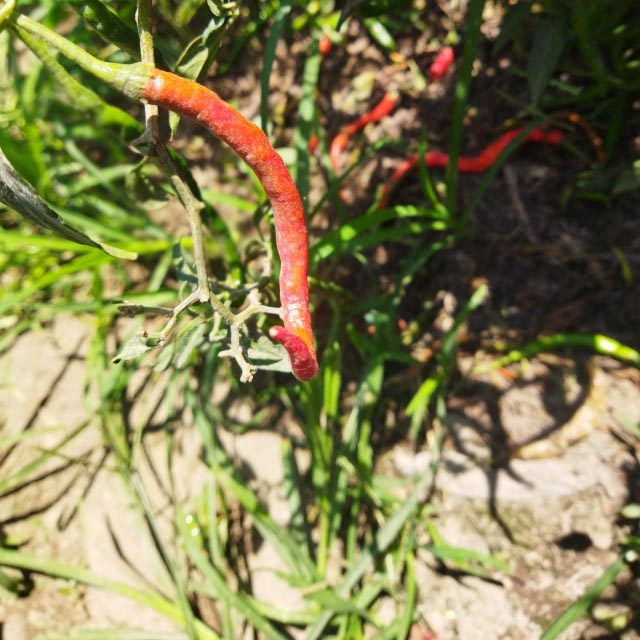

In [ ]:
# select random image from validation data
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.33,0.33,0.33,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Predicted Caption:', ' '.join(caption))
Image(filename = image)

BLEU-1 score: 54.974270793760226
BLEU-2 score: 51.60321157488909
BLEU-3 score: 50.06344930163645
BLEU-4 score: 48.494144643100995
Predicted Caption: a yellow bird 's eye chili infested by fruit fly grows from a branch


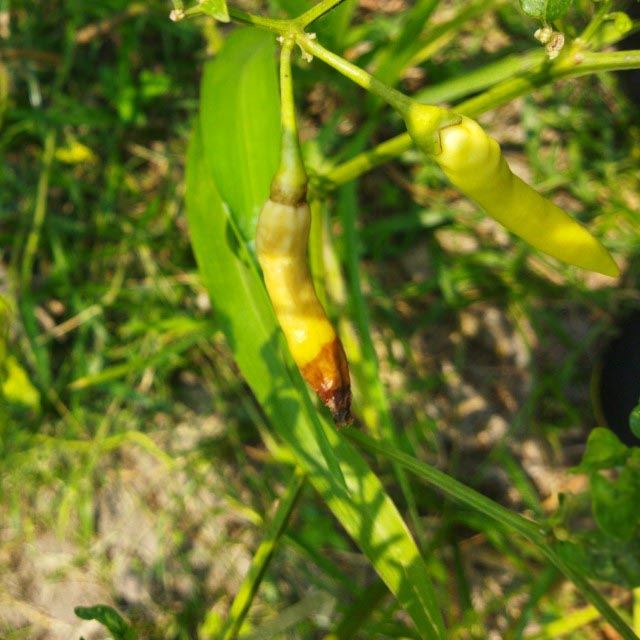

In [ ]:
# select random image from validation data
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.33,0.33,0.33,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Predicted Caption:', ' '.join(caption))
Image(filename = image)

# Detect Image from Any Source

In [ ]:
%cd /content/gdrive/MyDrive/Tesis/YOLO
!git clone https://github.com/ultralytics/yolov5  # clone
%cd /content/gdrive/MyDrive/Tesis/YOLO/yolov5
%pip install -qr requirements.txt # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-247-g3f02fde Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.5/166.8 GB disk)


In [ ]:
#
!python detect.py --weights '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/train/yolov5s_results/weights/best.pt' --source '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/Percobaan untuk testing' --img 640 --conf 0.416 --name 'hasil_deteksi'

detect: weights=['/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/Percobaan untuk testing, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.416, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=hasil_deteksi, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-247-g3f02fde Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 182 layers, 7276185 parameters, 0 gradients
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/30 /content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/Percobaan untuk testing/cabaibesar0396.jpg: 640x640 1 Big Chili, 12.7ms
image 2/30 /content/gdr

In [ ]:
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasilku3/cabaibesarlb0152.jpg'

Predicted Caption: discovered a big chili infested by fruit fly surrounded by lush leaves


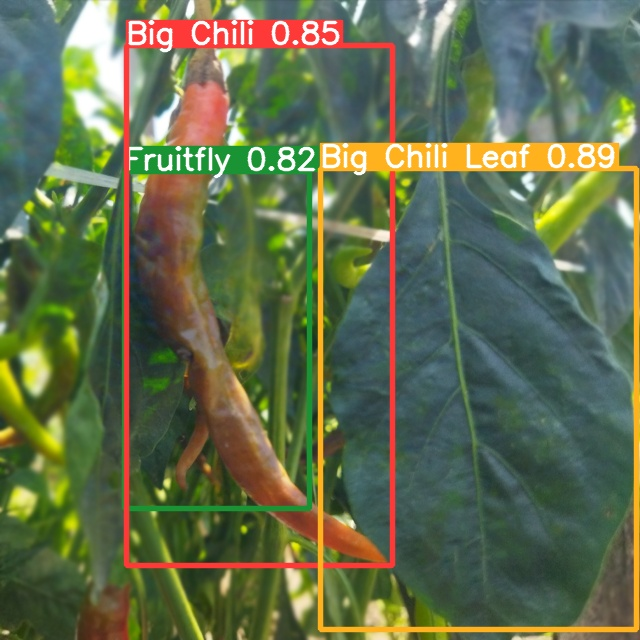

In [ ]:
caption,result,attention_weights = evaluate(myimage)
print ('Predicted Caption:', ' '.join(caption))
Image(filename = myimage)

Predicted Caption: a green bird 's eye chili leaf affected by gemini virus reveals a yellow surface above the ground


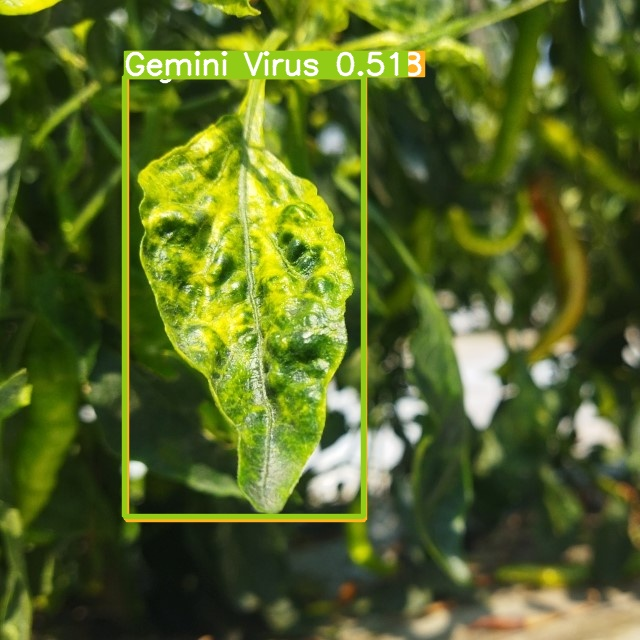

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/dcabaibesarvg0924.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasilku3/dcabaibesarvg0924.jpg'
Image(filename = myimage)

Predicted Caption: a green leaf looks unhealthy revealing a blackened surface


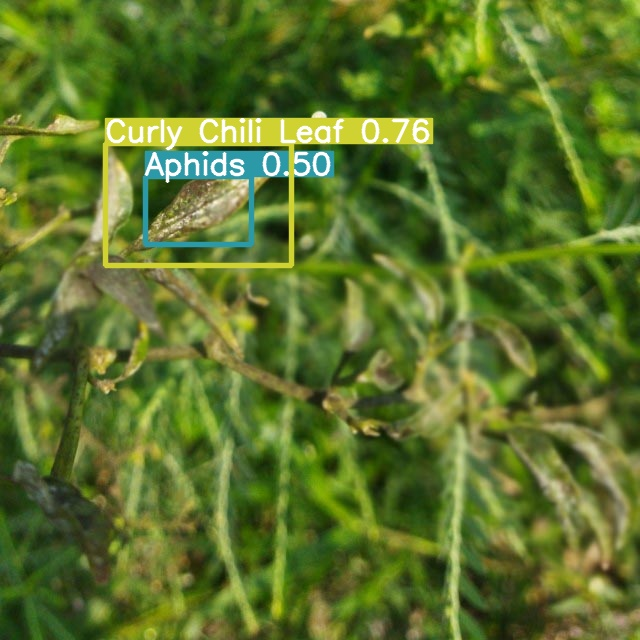

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/dcabaikeritingkk0547.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasilku3/dcabaikeritingkk0547.jpg'
Image(filename = myimage)

Predicted Caption: no visible damage on the curved sizable green chili


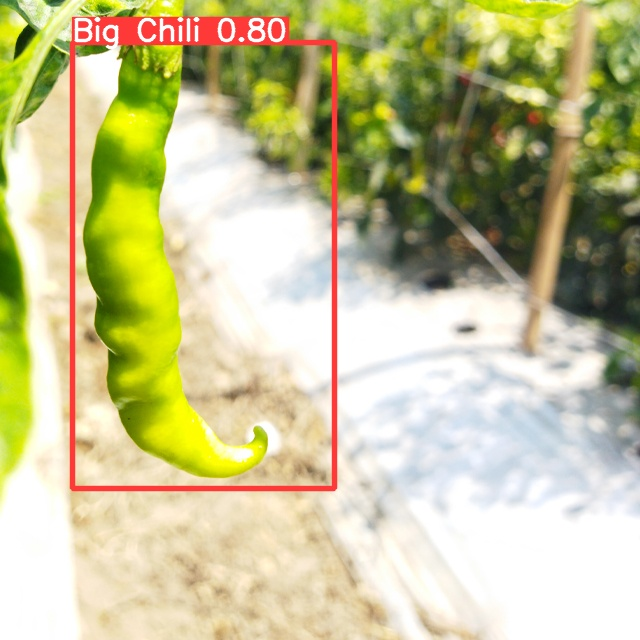

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/cabaibesar0743.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasilku3/cabaibesar0743.jpg'
Image(filename = myimage)

Predicted Caption: discovered a bird 's eye chili damaged by fruit fly hanging in the field


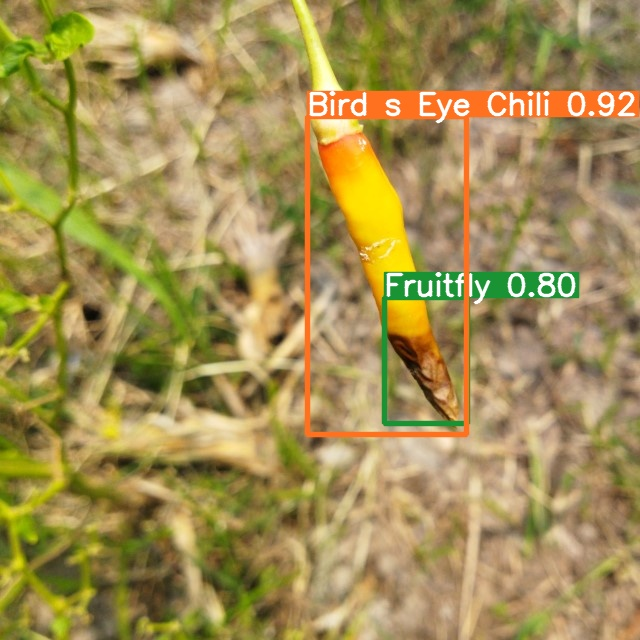

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/cabairawitlb0499.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasilku3/cabairawitlb0499.jpg'
Image(filename = myimage)

Di folder percobaan untuk testing

Predicted Caption: a healthy sizable red chili grows elegantly from a branch


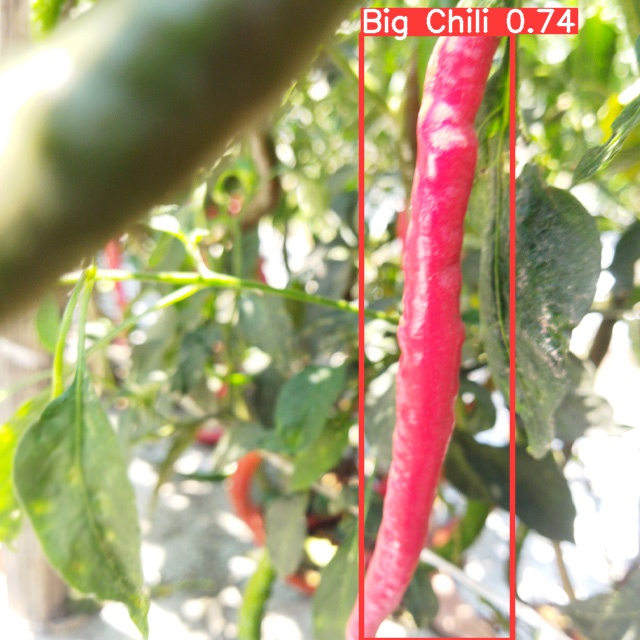

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/Percobaan untuk testing/cabaibesar0396.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasil_deteksi/cabaibesar0396.jpg'
Image(filename = myimage)

Predicted Caption: a big red chili attacked by fruit fly displays a dark brown surface


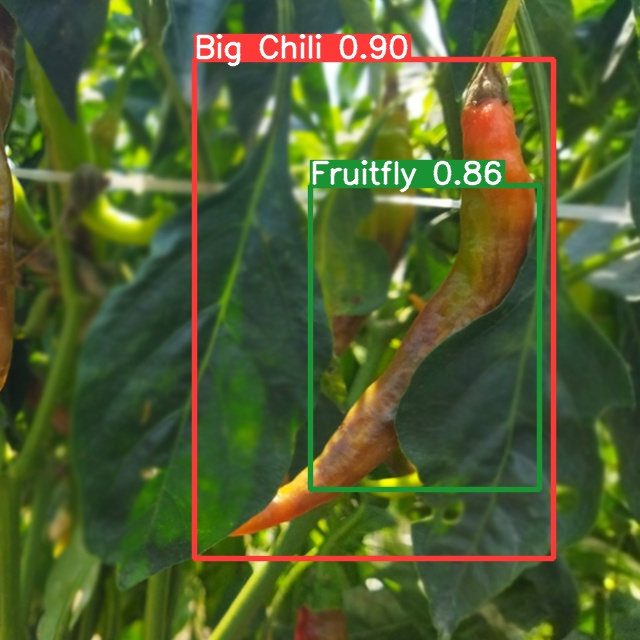

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/Percobaan untuk testing/cabaibesarlb0136.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasil_deteksi/cabaibesarlb0136.jpg'
Image(filename = myimage)

Predicted Caption: discovered a curved red curly chili hanging beside branches


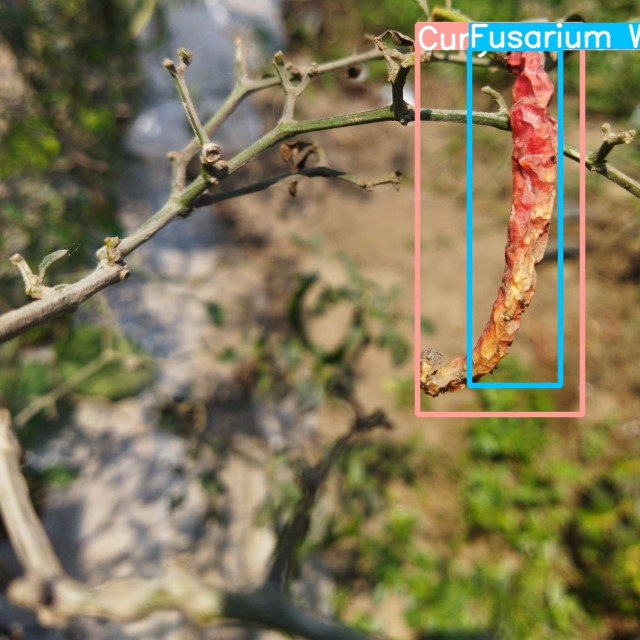

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/Percobaan untuk testing/cabaikeritinglf0395.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasil_deteksi/cabaikeritinglf0395.jpg'
Image(filename = myimage)

Predicted Caption: a green bird 's eye chili leaf damaged by fruit fly shows rotten area


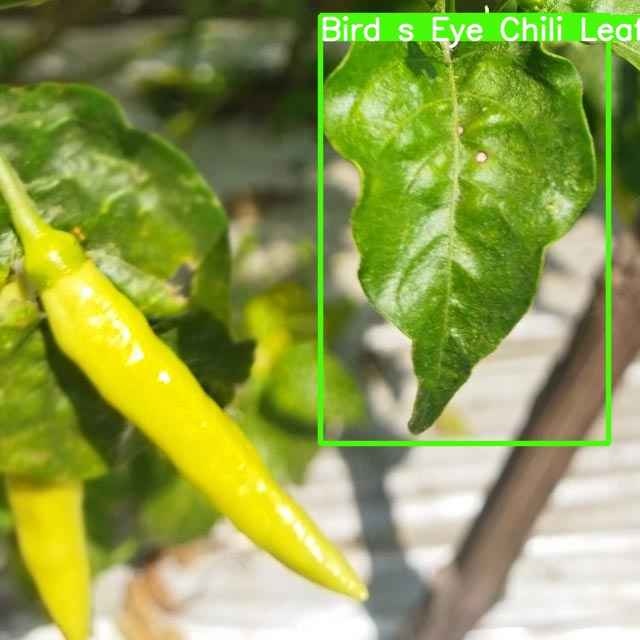

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/Percobaan untuk testing/dauncabairawitbercak0219.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasil_deteksi/dauncabairawitbercak0219.jpg'
Image(filename = myimage)

Predicted Caption: two big chili leaves damaged by yellow virus hang surrounded by leaves


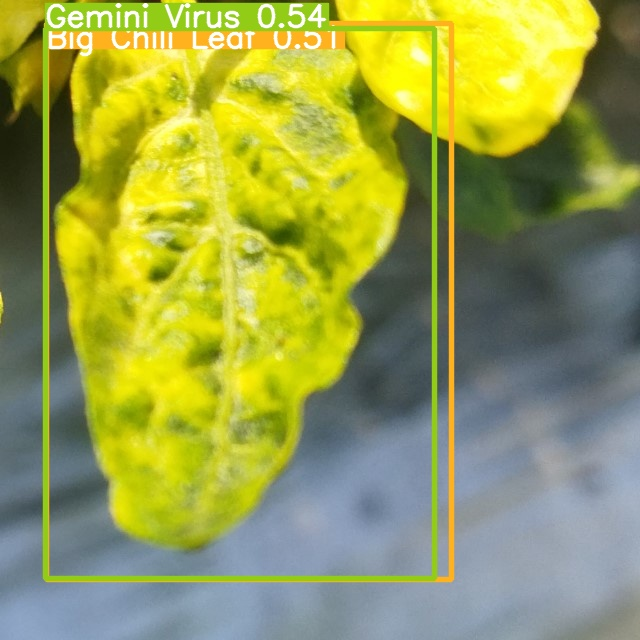

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/Percobaan untuk testing/dcabaibesarvg0343.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasil_deteksi/dcabaibesarvg0343.jpg'
Image(filename = myimage)

Predicted Caption: two big chili leaves damaged by yellow virus hanging surrounded by leaves


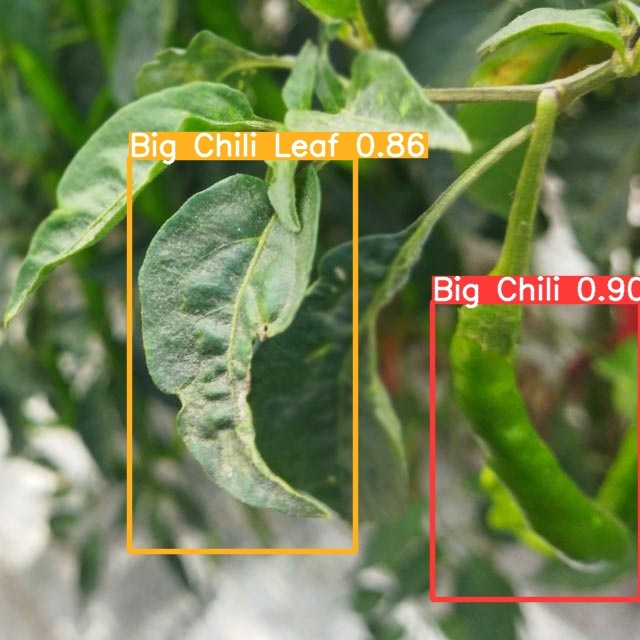

In [ ]:
myimagecap = '/content/gdrive/MyDrive/Tesis/Dataset_Cabai/contoh yg diujikan/Percobaan untuk testing/dcabaibesart0268.jpg'
caption,result,attention_weights = evaluate(myimagecap)
print ('Predicted Caption:', ' '.join(caption))
myimage = '/content/gdrive/MyDrive/Tesis/YOLO/yolov5/runs/detect/hasil_deteksi/dcabaibesart0268.jpg'
Image(filename = myimage)